# Detección de Tejido Cancerígeno en Imágenes de Histología

En la era contemporánea, la integración de la tecnología con la medicina ha abierto puertas innovadoras para el diagnóstico y tratamiento de diversas enfermedades, incluido el cáncer. Una de las técnicas emergentes en este panorama es la la clasificación de imágenes, una especialidad dentro del aprendizaje profundo, dedicada a la identificación de estructuras dentro de una imagen.

En el ámbito de la oncología, el análisis microscópico de muestras de tejido, conocido como histología, ha sido el estándar de oro para la detección y clasificación de tejidos cancerosos. Sin embargo, esta tarea es notoriamente laboriosa y depende en gran medida de la habilidad y experiencia del patólogo.

En este contexto, la Inteligencia Artificial se presenta como una herramienta prometedora para asistir y potencialmente revolucionar los métodos tradicionales de diagnóstico histológico. Mediante el uso de algoritmos avanzados, es posible analizar grandes cantidades de imágenes histológicas con una precisión y rapidez sin precedentes, facilitando así la identificación temprana de tejido cancerígeno y ayudando a tomar decisiones clínicas más precisas.

En este taller, la idea es que ustedes construyan un sistema que permita identificar tejido cancerígeno en imágenes histológicas. El modelo que construyan debe contener, al menos estos elementos.

1. Construir una red neuronal convolucional a partir de transfer learning. Deben probar al menos cuatro arquitecturas, un de ellas debe haber sido entrenada en imágenes de histología. Pueden encontrar un ejemplo en: https://github.com/lunit-io/benchmark-ssl-pathology.

2. Para una de las arquitecturas generales, deben usar fine tuning de, al menos, una capa convolucional.

3. Deben realizar DataAugmentation.

4. Reportar las gráficas de loss para el train y test.

5. Deben reportar el rendimiento del modelo, sobre el conjunto de prueba, a partir del accuracy y el F-1 score.

6. El F-1 score, sobre el conjunto de test, debe ser de al menos el 85%.

7. Deben usar GradCam o GradCam++ para la explicabilidad del modelo.


## 1. Se Descarga y descomprime la base de datos

La base de datos está dividida en dos carpetas; en la primera se encuentran los datos de entrenamiento, en la segunda los datos de prueba.

In [10]:
!gdown 1c2mrPeND5-jxL43Im8eDi5PCyuTGBLEX
!gdown 1n_zGW0qht4rQauar3hQkqpz8sreb0SRv

Failed to retrieve file url:

	Too many users have viewed or downloaded this file recently. Please
	try accessing the file again later. If the file you are trying to
	access is particularly large or is shared with many people, it may
	take up to 24 hours to be able to view or download the file. If you
	still can't access a file after 24 hours, contact your domain
	administrator.

You may still be able to access the file from the browser:

	https://drive.google.com/uc?id=1c2mrPeND5-jxL43Im8eDi5PCyuTGBLEX

but Gdown can't. Please check connections and permissions.
Downloading...
From (original): https://drive.google.com/uc?id=1n_zGW0qht4rQauar3hQkqpz8sreb0SRv
From (redirected): https://drive.google.com/uc?id=1n_zGW0qht4rQauar3hQkqpz8sreb0SRv&confirm=t&uuid=12789ac8-7040-4298-be7c-4c57da5e16e8
To: /workspaces/Deep Learning/src/project/test.zip
100%|████████████████████████████████████████| 380M/380M [00:22<00:00, 16.8MB/s]


In [1]:
#Se decomprimen los archivos zip descargados

!unzip -n ./train.zip 
!unzip -n ./test.zip 

Archive:  ./train.zip
  inflating: Train_non_experts_simple/1/TCGA-A2-A04T-DX1_xmin72145_ymin39078_A04T_A2_x_ini_938_y_ini_1206.png  
  inflating: Train_non_experts_simple/1/TCGA-A2-A04T-DX1_xmin72145_ymin39078_A04T_A2_x_ini_2010_y_ini_1206.png  
  inflating: Train_non_experts_simple/1/TCGA-A2-A04T-DX1_xmin72145_ymin39078_A04T_A2_x_ini_2144_y_ini_1206.png  
  inflating: Train_non_experts_simple/1/TCGA-A2-A04T-DX1_xmin72145_ymin39078_A04T_A2_x_ini_3484_y_ini_1206.png  
  inflating: Train_non_experts_simple/1/TCGA-A2-A04T-DX1_xmin72145_ymin39078_A04T_A2_x_ini_3618_y_ini_1206.png  
  inflating: Train_non_experts_simple/1/TCGA-A2-A04T-DX1_xmin72145_ymin39078_A04T_A2_x_ini_3752_y_ini_1206.png  
  inflating: Train_non_experts_simple/1/TCGA-A2-A04T-DX1_xmin72145_ymin39078_A04T_A2_x_ini_3886_y_ini_1206.png  
  inflating: Train_non_experts_simple/1/TCGA-A2-A04T-DX1_xmin72145_ymin39078_A04T_A2_x_ini_4020_y_ini_1206.png  
  inflating: Train_non_experts_simple/1/TCGA-A2-A04T-DX1_xmin72145_ymin3907

## 2. Descripción de la compocisión de la base de datos y visualización de algunas muestras.

Como se puede notar en las carpetas de entrenamiento y prueba existen 3 subcarpetas llamadas 0, 1, 2, la cuales representan cada una de las clases del problema. De esta forma.

- Las imágenes en la carpeta 0 corresponden a tumores.

- Las imágenes en la carpeta 1 corresponden a Estroma (Tejido conjuntivo)

- Las imágenes en la carpeta 2 corresponden a tejidos con inflamación benigna.

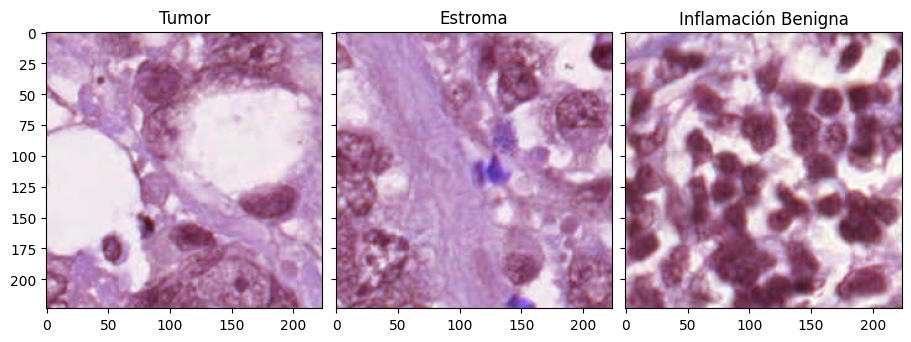

In [2]:
import matplotlib.pyplot as plt
import cv2

Train_dir_i = './Train_non_experts_simple' #Dirección de las imágenes de entrenamiento


fig, axs = plt.subplots(1, 3, figsize=(9, 5), layout='constrained',
                        sharex=True, sharey=True)

# Se carga una imagen de la carpeta 0 (Tumor)
file_name_i = './Train_non_experts_simple/1/TCGA-A1-A0SK-DX1_xmin45749_ymin25055_A0SK_A1_x_ini_0_y_ini_0.png'
Img_i = cv2.imread(file_name_i)
plt.subplot(1, 3, 1)
plt.title("Tumor")
plt.imshow(Img_i)

# Se carga una imagen de la carpeta 1 (Estroma)
file_name_i = './Train_non_experts_simple/2/TCGA-A1-A0SK-DX1_xmin45749_ymin25055_A0SK_A1_x_ini_0_y_ini_2412.png'
Img_i = cv2.imread(file_name_i)
plt.subplot(1, 3, 2)
plt.title("Estroma")
plt.imshow(Img_i)

# Se carga una imagen de la carpeta 2 (Inflamación Benigna)
file_name_i = './Train_non_experts_simple/3/TCGA-A1-A0SP-DX1_xmin6798_ymin53719_A0SP_A1_x_ini_1072_y_ini_0.png'
Img_i = cv2.imread(file_name_i)
plt.subplot(1, 3, 3)
plt.title("Inflamación Benigna")
plt.imshow(Img_i)



In [11]:
import os
import copy
import time
from collections import Counter

import matplotlib.pyplot as plt
import numpy as np
import torch
from torch import nn
from torch.utils.data import DataLoader
from torchvision import datasets, transforms, models
from sklearn.metrics import accuracy_score, f1_score, classification_report

In [12]:
# Paso 1: Definicion de rutas y transforms para transfer learning
train_dir = './Train_non_experts_simple'
test_dir = './Test'

# Normalizacion de ImageNet (recomendada para backbones preentrenados)
imagenet_mean = [0.485, 0.456, 0.406]
imagenet_std = [0.229, 0.224, 0.225]

train_transform = transforms.Compose([
    transforms.RandomResizedCrop(224, scale=(0.8, 1.0)),
    transforms.RandomHorizontalFlip(p=0.5),
    transforms.RandomRotation(degrees=15),
    transforms.ColorJitter(brightness=0.2, contrast=0.2, saturation=0.15, hue=0.02),
    transforms.ToTensor(),
    transforms.Normalize(mean=imagenet_mean, std=imagenet_std),
])

test_transform = transforms.Compose([
    transforms.Resize(256),
    transforms.CenterCrop(224),
    transforms.ToTensor(),
    transforms.Normalize(mean=imagenet_mean, std=imagenet_std),
])

train_data = datasets.ImageFolder(root=train_dir, transform=train_transform)
test_data = datasets.ImageFolder(root=test_dir, transform=test_transform)

print(f'Train samples: {len(train_data)}')
print(f'Test samples: {len(test_data)}')
print(f'class_to_idx: {train_data.class_to_idx}')

Train samples: 75243
Test samples: 4364
class_to_idx: {'1': 0, '2': 1, '3': 2}


In [3]:
# Conteo de ejemplos por clase (train/test)
train_counts = Counter([label for _, label in train_data.samples])
test_counts = Counter([label for _, label in test_data.samples])

idx_to_class = {v: k for k, v in train_data.class_to_idx.items()}

print('Distribucion train:')
for idx in sorted(train_counts.keys()):
    print(f'  Clase {idx} ({idx_to_class[idx]}): {train_counts[idx]}')

print('\nDistribucion test:')
for idx in sorted(test_counts.keys()):
    print(f'  Clase {idx} ({idx_to_class[idx]}): {test_counts[idx]}')

Distribucion train:
  Clase 0 (1): 37260
  Clase 1 (2): 27668
  Clase 2 (3): 10315

Distribucion test:
  Clase 0 (1): 2692
  Clase 1 (2): 1196
  Clase 2 (3): 476


In [13]:
# DataLoaders
batch_size = 32
num_workers = os.cpu_count() // 2 if os.cpu_count() and os.cpu_count() > 1 else 0

train_dataloader = DataLoader(
    train_data,
    batch_size=batch_size,
    shuffle=True,
    num_workers=num_workers,
    pin_memory=True,
    drop_last=False,
    persistent_workers=(num_workers > 0),
)

test_dataloader = DataLoader(
    test_data,
    batch_size=batch_size,
    shuffle=False,
    num_workers=num_workers,
    pin_memory=True,
    drop_last=False,
    persistent_workers=(num_workers > 0),
)

labels_map = {idx: name for name, idx in train_data.class_to_idx.items()}
human_names = {0: 'Tumor', 1: 'Estroma', 2: 'Inflamacion Benigna'}
num_classes = len(labels_map)

print(f'Batch size: {batch_size} | num_workers: {num_workers} | num_classes: {num_classes}')
print(f'labels_map (carpetas): {labels_map}')
print(f'labels_map (humano): {human_names}')

Batch size: 32 | num_workers: 3 | num_classes: 3
labels_map (carpetas): {0: '1', 1: '2', 2: '3'}
labels_map (humano): {0: 'Tumor', 1: 'Estroma', 2: 'Inflamacion Benigna'}


In [14]:
# Verificacion rapida de un batch
images, targets = next(iter(train_dataloader))
print(f'Batch images shape: {images.shape}')
print(f'Batch labels shape: {targets.shape}')
print(f'Rango etiquetas en batch: min={targets.min().item()}, max={targets.max().item()}')

# Dispositivo
device = torch.device('cuda:0' if torch.cuda.is_available() else 'cpu')
print(f'Device: {device}')

Batch images shape: torch.Size([32, 3, 224, 224])
Batch labels shape: torch.Size([32])
Rango etiquetas en batch: min=0, max=2
Device: cuda:0


In [9]:
# Paso 2: Transfer Learning (base de clase 8)
weights = models.ResNet18_Weights.DEFAULT
model = models.resnet18(weights=weights)

# Congelar backbone para etapa inicial
for param in model.parameters():
    param.requires_grad = False

# Reemplazar la capa final para 3 clases
in_features = model.fc.in_features
model.fc = nn.Linear(in_features, num_classes)

# Solo el head se entrena en esta etapa
for param in model.fc.parameters():
    param.requires_grad = True

model = model.to(device)
print(model)
print('\nParametros entrenables (etapa 1):')
print(sum(p.numel() for p in model.parameters() if p.requires_grad))

Downloading: "https://download.pytorch.org/models/resnet18-f37072fd.pth" to /root/.cache/torch/hub/checkpoints/resnet18-f37072fd.pth
100%|██████████| 44.7M/44.7M [00:02<00:00, 18.7MB/s]


ResNet(
  (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
  (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (relu): ReLU(inplace=True)
  (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
  (layer1): Sequential(
    (0): BasicBlock(
      (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
      (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    )
    (1): BasicBlock(
      (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
  

In [7]:
# Funciones de entrenamiento y evaluacion
def train_one_epoch(model, dataloader, loss_fn, optimizer, device):
    model.train()
    running_loss = 0.0
    all_preds = []
    all_targets = []

    for x, y in dataloader:
        x, y = x.to(device), y.to(device)
        optimizer.zero_grad()
        logits = model(x)
        loss = loss_fn(logits, y)
        loss.backward()
        optimizer.step()

        running_loss += loss.item() * y.size(0)
        preds = torch.argmax(logits, dim=1)
        all_preds.extend(preds.detach().cpu().numpy())
        all_targets.extend(y.detach().cpu().numpy())

    epoch_loss = running_loss / len(dataloader.dataset)
    epoch_acc = accuracy_score(all_targets, all_preds)
    epoch_f1 = f1_score(all_targets, all_preds, average='macro')
    return epoch_loss, epoch_acc, epoch_f1


@torch.no_grad()
def evaluate(model, dataloader, loss_fn, device):
    model.eval()
    running_loss = 0.0
    all_preds = []
    all_targets = []

    for x, y in dataloader:
        x, y = x.to(device), y.to(device)
        logits = model(x)
        loss = loss_fn(logits, y)

        running_loss += loss.item() * y.size(0)
        preds = torch.argmax(logits, dim=1)
        all_preds.extend(preds.cpu().numpy())
        all_targets.extend(y.cpu().numpy())

    epoch_loss = running_loss / len(dataloader.dataset)
    epoch_acc = accuracy_score(all_targets, all_preds)
    epoch_f1 = f1_score(all_targets, all_preds, average='macro')
    return epoch_loss, epoch_acc, epoch_f1, np.array(all_targets), np.array(all_preds)


def run_training(model, train_loader, test_loader, loss_fn, optimizer, epochs, device):
    history = {
        'train_loss': [], 'test_loss': [],
        'train_acc': [], 'test_acc': [],
        'train_f1': [], 'test_f1': [],
    }

    best_f1 = -1.0
    best_state = copy.deepcopy(model.state_dict())

    for epoch in range(1, epochs + 1):
        t0 = time.time()
        tr_loss, tr_acc, tr_f1 = train_one_epoch(model, train_loader, loss_fn, optimizer, device)
        te_loss, te_acc, te_f1, _, _ = evaluate(model, test_loader, loss_fn, device)

        history['train_loss'].append(tr_loss)
        history['test_loss'].append(te_loss)
        history['train_acc'].append(tr_acc)
        history['test_acc'].append(te_acc)
        history['train_f1'].append(tr_f1)
        history['test_f1'].append(te_f1)

        if te_f1 > best_f1:
            best_f1 = te_f1
            best_state = copy.deepcopy(model.state_dict())

        dt = time.time() - t0
        print(
            f"Epoch {epoch:02d}/{epochs} | "
            f"train_loss={tr_loss:.4f} test_loss={te_loss:.4f} | "
            f"train_acc={tr_acc:.4f} test_acc={te_acc:.4f} | "
            f"train_f1={tr_f1:.4f} test_f1={te_f1:.4f} | "
            f"{dt:.1f}s"
        )

    model.load_state_dict(best_state)
    return history

In [ ]:
# Etapa 1 (head training, backbone congelado)
loss_fn = nn.CrossEntropyLoss()
optimizer = torch.optim.Adam(model.fc.parameters(), lr=1e-3)
epochs_stage1 = 5

history_stage1 = run_training(
    model,
    train_dataloader,
    test_dataloader,
    loss_fn,
    optimizer,
    epochs_stage1,
    device,
)

In [ ]:
# Etapa 2 (Fine Tuning, base de clase 9)
for name, param in model.named_parameters():
    # Se descongelan las dos ultimas capas residuales
    if name.startswith('layer4') or name.startswith('layer3') or name.startswith('fc'):
        param.requires_grad = True
    else:
        param.requires_grad = False

trainable_params = [p for p in model.parameters() if p.requires_grad]
optimizer_ft = torch.optim.Adam(trainable_params, lr=1e-4)
epochs_stage2 = 5

history_stage2 = run_training(
    model,
    train_dataloader,
    test_dataloader,
    loss_fn,
    optimizer_ft,
    epochs_stage2,
    device,
)

In [ ]:
# Curvas de entrenamiento y evaluacion final
def plot_history(history1, history2=None):
    if history2 is None:
        loss_train = history1['train_loss']
        loss_test = history1['test_loss']
    else:
        loss_train = history1['train_loss'] + history2['train_loss']
        loss_test = history1['test_loss'] + history2['test_loss']

    plt.figure(figsize=(8, 4))
    plt.plot(loss_train, label='train_loss')
    plt.plot(loss_test, label='test_loss')
    plt.xlabel('Epoch')
    plt.ylabel('Loss')
    plt.title('Curvas de loss')
    plt.legend()
    plt.show()


plot_history(history_stage1, history_stage2)

test_loss, test_acc, test_f1, y_true, y_pred = evaluate(
    model, test_dataloader, loss_fn, device
)

ordered_target_names = [human_names[i] for i in sorted(human_names)]

print(f'Test Accuracy: {test_acc:.4f}')
print(f'Test F1-macro: {test_f1:.4f}')
print('\nReporte de clasificacion:')
print(classification_report(y_true, y_pred, target_names=ordered_target_names))